## Import Packages

In [1]:
import pandas as pd
import altair as alt
from altair_saver import save
import seaborn as sns
import matplotlib.pyplot as plt
import dataframe_image as dfi

alt.renderers.enable('mimetype')

RendererRegistry.enable('mimetype')

___

## Read cleaned train data

In [2]:
train_df = pd.read_csv('../data/processed/train_df.csv')

## Data Wrangling
>Converting Churn column from boolean to string, changing column names to capitalized format

In [3]:
train_df['Churn'] = train_df['Churn'].replace(True, "True")
train_df['Churn'] = train_df['Churn'].replace(False, "False")

train_df = train_df.rename(columns={'tenure': 'Tenure',
                                    'SeniorCitizen': 'Senior Citizen',
                                    'MonthlyCharges': 'Monthly Charges',
                                    'TotalCharges': 'Total Charges',
                                    'InternetService': 'Internet Service',
                                    'MultipleLines': 'Multiple Lines',
                                    'OnlineSecurity': 'Online Security',
                                    'OnlineBackup': 'Online Backup',
                                    'DeviceProtection': 'Device Protection',
                                    'StreamingMovies': 'Streaming Movies',
                                    'StreamingTV': 'Streaming TV',
                                    'PhoneService': 'Phone Service',
                                    'TechSupport': 'Tech Support',
                                    'PaperlessBilling': 'Paperless Billing',
                                    'PaymentMethod': 'Payment Method'})

## Looking into the data

In [4]:
train_df.head()

,Senior Citizen,Partner,Dependents,Tenure,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn
0,No,No,No,20,Yes,Yes,DSL,No,Yes,No,Yes,Yes,No,One year,Yes,Electronic check,68.70,1416.2,False
1,No,Yes,Yes,69,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,103.95,7446.9,True
2,Yes,Yes,No,12,Yes,No,Fiber optic,No,No,No,No,No,Yes,Month-to-month,Yes,Electronic check,80.45,950.2,True
3,Yes,No,No,14,Yes,No,Fiber optic,No,No,No,No,Yes,Yes,Month-to-month,No,Credit card (automatic),90.45,1266.1,True
4,No,No,No,1,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,21.10,21.1,False


In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4930 entries, 0 to 4929
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Senior Citizen     4930 non-null   object 
 1   Partner            4930 non-null   object 
 2   Dependents         4930 non-null   object 
 3   Tenure             4930 non-null   int64  
 4   Phone Service      4930 non-null   object 
 5   Multiple Lines     4930 non-null   object 
 6   Internet Service   4930 non-null   object 
 7   Online Security    4930 non-null   object 
 8   Online Backup      4930 non-null   object 
 9   Device Protection  4930 non-null   object 
 10  Tech Support       4930 non-null   object 
 11  Streaming TV       4930 non-null   object 
 12  Streaming Movies   4930 non-null   object 
 13  Contract           4930 non-null   object 
 14  Paperless Billing  4930 non-null   object 
 15  Payment Method     4930 non-null   object 
 16  Monthly Charges    4930 

There are 18 columns in the dataframe, out of which only 3 are numeric

In [6]:
train_df.isnull().sum()

Senior Citizen       0
Partner              0
Dependents           0
Tenure               0
Phone Service        0
Multiple Lines       0
Internet Service     0
Online Security      0
Online Backup        0
Device Protection    0
Tech Support         0
Streaming TV         0
Streaming Movies     0
Contract             0
Paperless Billing    0
Payment Method       0
Monthly Charges      0
Total Charges        8
Churn                0
dtype: int64

There are missing values in the Total Charges column

## Target ('Churn') class
### Class Imbalance for target class

In [7]:
churn_dist_df = pd.DataFrame(round(train_df["Churn"].value_counts(normalize=True), 2))
churn_dist_df

,Churn
False,0.73
True,0.27


In [8]:
#dfi.export(churn_dist_df, "../results/churn_dist_table.png")

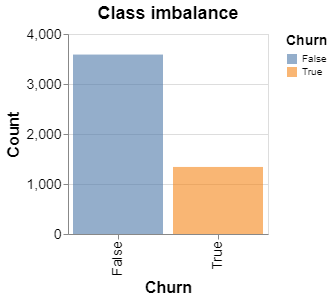

In [9]:
target_class_imbalance = alt.Chart(train_df, title='Class imbalance').mark_bar(opacity=0.6).encode(
     alt.X('Churn:N'),
     alt.Y('count()', title='Count'),
     color='Churn',
).properties(
    width=200,
    height=200
).configure_axis(
    labelFontSize=14,
    titleFontSize=16
).configure_legend(
    titleFontSize=14
).configure_title(
    fontSize=18
)

target_class_imbalance

In [10]:
#target_class_imbalance.save("../results/target_class_imbalance.png")

There is class imbalance in target column, where 73% observations are for the negative class (Churn='False'). We will to explore whether employing techniques to address class imbalance may be of help to improving model performance in regards to predicting the minority class.

---------------

## Numerical Features

> Statistic summary for numeric features

In [11]:
train_df.describe()

,Tenure,Monthly Charges,Total Charges
count,4930.000000,4930.000000,4922.000000
mean,32.214807,64.791176,2278.304907
std,24.555738,30.127626,2270.603490
min,0.000000,18.250000,18.800000
25%,8.000000,35.400000,389.337500
50%,29.000000,70.400000,1392.225000
75%,55.000000,89.850000,3776.825000
max,72.000000,118.650000,8684.800000


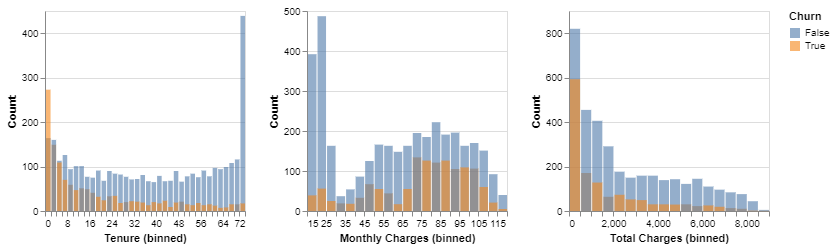

In [12]:
numeric_feat_dist = alt.Chart(train_df).mark_bar(opacity=0.6).encode(
     alt.X(alt.repeat(), type='quantitative', bin=alt.Bin(maxbins=40)),
     alt.Y('count()', title='Count', stack=False),
     color='Churn'
).properties(
    width=200,
    height=200
).repeat(
    ['Tenure', 'Monthly Charges', 'Total Charges']
)

numeric_feat_dist

In [13]:
#numeric_feat_dist.save("numeric_feat_dist.png")

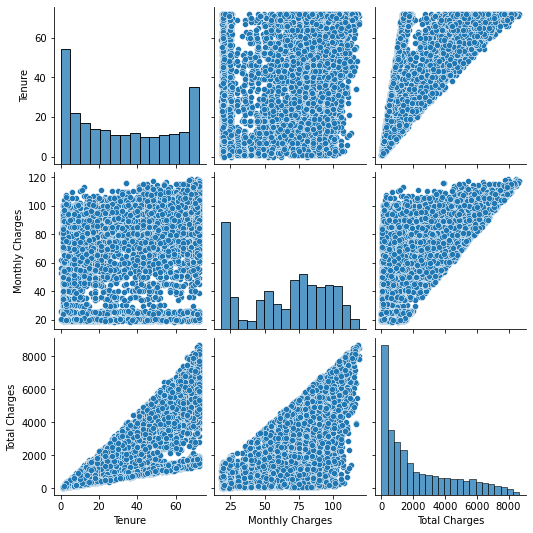

In [14]:
numeric_feat_pairplot = sns.pairplot(train_df)
numeric_feat_pairplot

In [15]:
#numeric_feat_pairplot.figure.savefig("../results/numeric_feat_pairplot.png")

<AxesSubplot:>

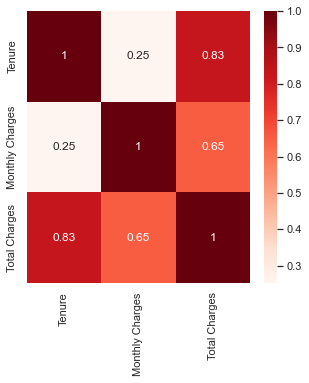

In [16]:
cor = train_df.corr()
plt.figure(figsize=(5, 5))
sns.set(font_scale=1)
numeric_feat_corr = sns.heatmap(cor, annot=True, cmap=plt.cm.Reds);
numeric_feat_corr

In [17]:
#numeric_feat_corr.figure.savefig("../results/numeric_feat_corr.png")

Positive correlation is observed between (1) `Tenure` and `Total Charges`, as well as between (2) `Monthly Charges` and `Total Charges`. This should be addressed when formuating the predictive model.

____
## Categorical Features
### Unique categories for all features

In [18]:
train_cat = train_df.select_dtypes(include='object').copy()

catfeatures_stats = pd.DataFrame(columns=['Feature', 'Unique values', 'Categories', 'Missing values'])

tmp = pd.DataFrame()

for c in train_cat.columns:
    tmp['Feature'] = [c]
    tmp['Unique values'] = [train_cat[c].unique()]
    tmp['Categories'] = int(train_cat[c].nunique())
    tmp['Missing values'] = train_cat[c].isnull().sum()
    catfeatures_stats = catfeatures_stats.append(tmp)

catfeatures_stats

,Feature,Unique values,Categories,Missing values
0,Senior Citizen,"[No, Yes]",2,0
0,Partner,"[No, Yes]",2,0
0,Dependents,"[No, Yes]",2,0
0,Phone Service,"[Yes, No]",2,0
0,Multiple Lines,"[Yes, No, No phone service]",3,0
0,Internet Service,"[DSL, Fiber optic, No]",3,0
0,Online Security,"[No, No internet service, Yes]",3,0
0,Online Backup,"[Yes, No, No internet service]",3,0
0,Device Protection,"[No, Yes, No internet service]",3,0
0,Tech Support,"[Yes, No, No internet service]",3,0


In [19]:
#dfi.export(catfeatures_stats, "../results/categorical_unique_values.png")

### Distribution across categories

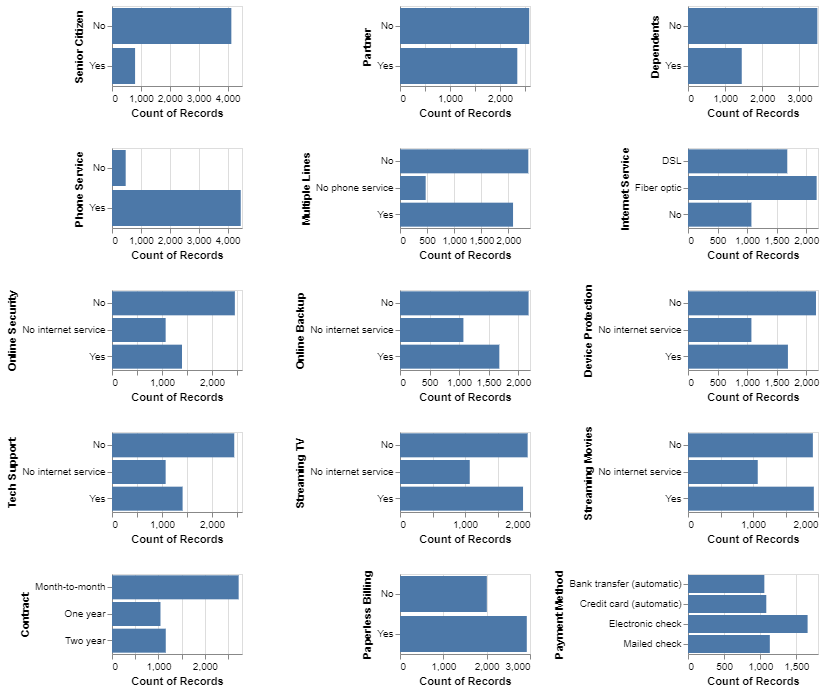

In [20]:
cat_feat_dist = alt.Chart(train_df).mark_bar().encode(
     alt.Y(alt.repeat(), type='nominal'),
     x='count()',
).properties(
    width=130,
    height=80
).repeat(
    ['Senior Citizen', 'Partner', 'Dependents', 'Phone Service',
     'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup',
     'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies',
     'Contract', 'Paperless Billing', 'Payment Method'],
    columns=3
)

cat_feat_dist

In [21]:
#cat_feat_dist.save(cat_feat_dist.png)

The plots above show how each categorical feature is distributed. Now lets consider the relationships between some of the categorical features and our target churn class.

## Categorical features for Demographics

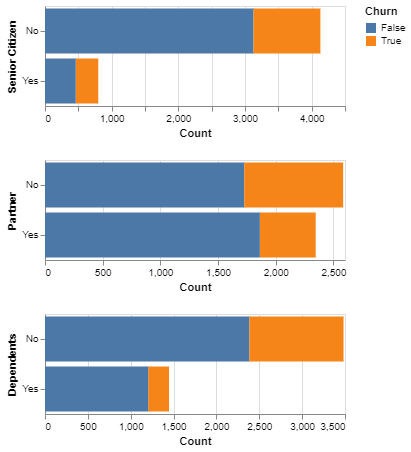

In [22]:
cat_feat_churn_dist = alt.Chart(train_df).mark_bar().encode(
    alt.X('count()', title='Count'),
    alt.Y(alt.repeat(), type='nominal'),
    alt.Color('Churn')
).properties(
    height=100,
    width = 300
).repeat(
    ['Senior Citizen', 'Partner', 'Dependents'],
    columns=1
)

cat_feat_churn_dist

In [23]:
#cat_feat_churn_dist.save("cat_feat_churn_dist.png")

____
# Evaluating High Churn Categories for Telco Services

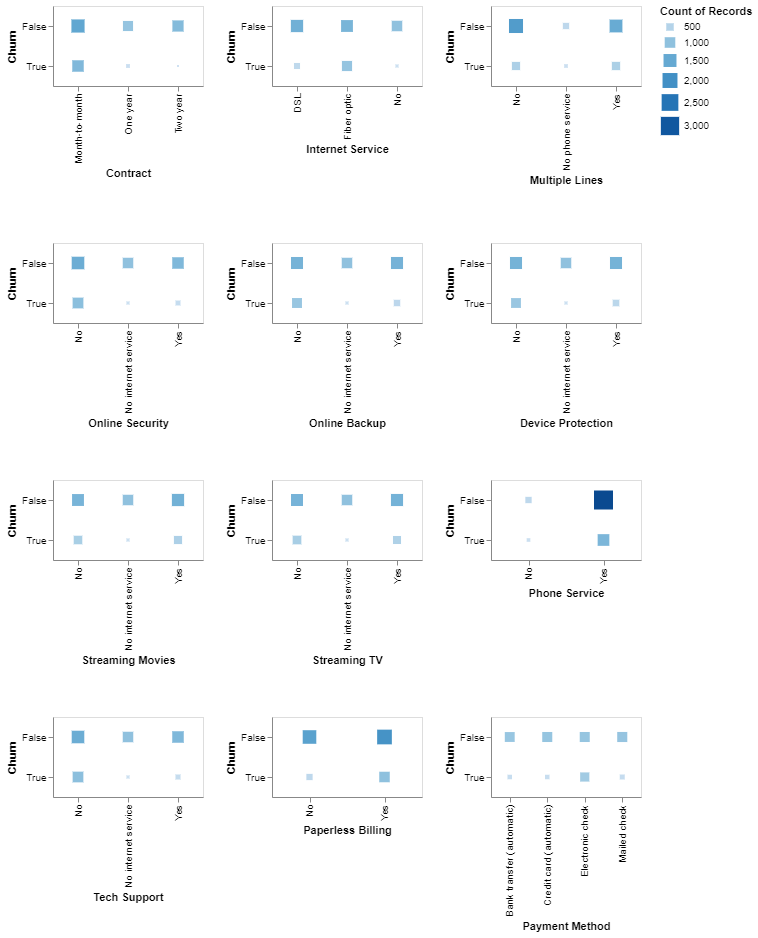

In [24]:
cat_feat_2dhist = alt.Chart(train_df).mark_square().encode(
    alt.X(alt.repeat(), type='nominal'),
    y='Churn',
    color='count()',
    size='count()').properties(
    width=150,
    height=80).repeat(
    ['Contract', 'Internet Service', 'Multiple Lines', 'Online Security',
     'Online Backup', 'Device Protection', 'Streaming Movies', 'Streaming TV',
     'Phone Service', 'Tech Support', 'Paperless Billing', 'Payment Method'],
    columns=3
)

cat_feat_2dhist

In [25]:
#cat_feat_2dhist.save("cat_feat_2dhist .png")

> High Churn rate customer categories for various features:
> - Internet Service : customers with Fiber Optic service have the highest Churn rate
> - Contract : customers with shorter Monthly contract have the highest Churn rate
> - Online Security : customers with No Online Security have higher Churn
> - Online Backup : customers with No Online Backup have higher Churn
> - Payment Method : customers with payment method of Electronic Check have higher Churn
> - Paperless Billing : customers with Paperless Billing have higher Churn
> - Tech Support : customers with No Technical Support have higher Churn
> - Device Protection : customers with No Device Protection have higher Churn

> For the following features, customer churn was equally distributed across all categories: Multiple Lines, Streaming Movies, Streaming TV

# Supplementry Analysis using Pandas profiling

In [26]:
from pandas_profiling import ProfileReport
prof = ProfileReport(train_df)
prof.to_file(output_file='../docs/telco_churn_feature_profile.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]